In [1]:
# CELL 1: Install Required Packages
# =============================================================================
!pip install -q pycocotools kaggle pillow matplotlib numpy
print("✓ Packages installed successfully")

✓ Packages installed successfully


In [3]:
# CELL 2: Download COCO Dataset Directly
# =============================================================================
import os
import urllib.request
from pycocotools.coco import COCO
import zipfile
from tqdm import tqdm

# Create directories
os.makedirs('/content/coco/annotations', exist_ok=True)
os.makedirs('/content/coco/val2017', exist_ok=True)

class DownloadProgressBar(tqdm):
    def update_to(self, b=1, bsize=1, tsize=None):
        if tsize is not None:
            self.total = tsize
        self.update(b * bsize - self.n)

def download_url(url, output_path):
    with DownloadProgressBar(unit='B', unit_scale=True, miniters=1, desc=url.split('/')[-1]) as t:
        urllib.request.urlretrieve(url, filename=output_path, reporthook=t.update_to)

# COCO 2017 Validation URLs
print("📥 Downloading COCO 2017 Validation Dataset...")
print("This may take several minutes...\n")

# Download validation images (1GB)
val_images_url = 'http://images.cocodataset.org/zips/val2017.zip'
val_images_path = '/content/coco/val2017.zip'

print("1/2 Downloading validation images (~1GB)...")
download_url(val_images_url, val_images_path)

# Download validation annotations (25MB)
val_ann_url = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
val_ann_path = '/content/coco/annotations.zip'

print("\n2/2 Downloading annotations (~241MB)...")
download_url(val_ann_url, val_ann_path)

print("\n✓ Download complete!")


📥 Downloading COCO 2017 Validation Dataset...
This may take several minutes...

1/2 Downloading validation images (~1GB)...


val2017.zip: 816MB [00:14, 57.2MB/s]                           



2/2 Downloading annotations (~241MB)...


annotations_trainval2017.zip: 253MB [00:04, 52.6MB/s]                           


✓ Download complete!


In [4]:
# CELL 3: Extract Dataset Files
# =============================================================================
print("\n📦 Extracting files...")

# Extract validation images
print("Extracting validation images...")
with zipfile.ZipFile(val_images_path, 'r') as zip_ref:
    zip_ref.extractall('/content/coco/')
print("✓ Images extracted")

# Extract annotations
print("Extracting annotations...")
with zipfile.ZipFile(val_ann_path, 'r') as zip_ref:
    zip_ref.extractall('/content/coco/')
print("✓ Annotations extracted")

print("\n✓ Extraction complete!")


📦 Extracting files...
Extracting validation images...
✓ Images extracted
Extracting annotations...
✓ Annotations extracted

✓ Extraction complete!


In [ ]:
# CELL 4: Delete Zip Files to Save Space
# =============================================================================
print("\n🗑️ Cleaning up zip files...")

# Delete zip files
if os.path.exists(val_images_path):
    os.remove(val_images_path)
    print(f"✓ Deleted {val_images_path}")

if os.path.exists(val_ann_path):
    os.remove(val_ann_path)
    print(f"✓ Deleted {val_ann_path}")

# Delete unnecessary annotation files (keep only instances)
ann_dir = '/content/coco/annotations'
for ann_file in os.listdir(ann_dir):
    if 'instances_val2017' not in ann_file:
        file_path = os.path.join(ann_dir, ann_file)
        if os.path.isfile(file_path):
            os.remove(file_path)
            print(f"✓ Deleted {ann_file}")

# Check disk space
print("\n📊 Current disk usage:")
!df -h | grep -E "Filesystem|/content"

In [5]:
# CELL 5: Load COCO Annotations
# =============================================================================
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import gc

# Load annotations
ann_file = '/content/coco/annotations/instances_val2017.json'
print("\n📂 Loading COCO annotations...")
coco = COCO(ann_file)

# Get all image IDs
img_ids = coco.getImgIds()
print(f"✓ Loaded {len(img_ids)} images from COCO validation set")

# Get category information
cats = coco.loadCats(coco.getCatIds())
cat_names = {cat['id']: cat['name'] for cat in cats}
print(f"✓ Found {len(cats)} object categories")

# Display some category examples
print("\n📋 Sample categories:")
sample_cats = list(cat_names.values())[:10]
print(", ".join(sample_cats))


📂 Loading COCO annotations...
loading annotations into memory...
Done (t=0.51s)
creating index...
index created!
✓ Loaded 5000 images from COCO validation set
✓ Found 80 object categories

📋 Sample categories:
person, bicycle, car, motorcycle, airplane, bus, train, truck, boat, traffic light


In [6]:
# CELL 6: Binary Masking Function (Memory Efficient)
# =============================================================================
def create_binary_mask(img_id, coco, img_dir='/content/coco/val2017'):
    """
    Create binary mask for main subject (largest object) in image.
    Memory efficient: processes one image at a time.

    Returns:
        original: Original image array
        mask: Binary mask (0s and 1s)
        masked: Image with mask applied
        category: Category name of the main subject
    """
    # Load image info
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(img_dir, img_info['file_name'])

    # Check if image exists
    if not os.path.exists(img_path):
        return None, None, None, None

    # Load image
    img = Image.open(img_path).convert('RGB')
    img_array = np.array(img)

    # Get annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    if len(anns) == 0:
        return None, None, None, None

    # Find largest object (main subject)
    largest_ann = max(anns, key=lambda x: x['area'])

    # Create binary mask
    mask = coco.annToMask(largest_ann)

    # Apply mask to image
    masked_img = img_array.copy()
    masked_img[mask == 0] = 0  # Set background to black

    # Get category name
    cat_id = largest_ann['category_id']
    cat_name = cat_names.get(cat_id, 'unknown')

    return img_array, mask, masked_img, cat_name

print("\n✓ Binary masking function defined")
print("   - Identifies largest object as main subject")
print("   - Creates binary mask (foreground/background)")
print("   - Applies mask to isolate subject")


✓ Binary masking function defined
   - Identifies largest object as main subject
   - Creates binary mask (foreground/background)
   - Applies mask to isolate subject


In [7]:
# CELL 7: Process and Display 20 Images
# =============================================================================
import random

# Randomly select 20 images
random.seed(42)
selected_ids = random.sample(img_ids, min(20, len(img_ids)))

print(f"\n🎨 Processing {len(selected_ids)} images with binary masking...")
print("This may take a minute...\n")

# Store results for display
results = []
successful_count = 0
failed_images = []

for idx, img_id in enumerate(selected_ids):
    try:
        # Process image
        original, mask, masked, category = create_binary_mask(img_id, coco)

        if original is None:
            failed_images.append(img_id)
            continue

        results.append({
            'original': original,
            'mask': mask,
            'masked': masked,
            'category': category,
            'img_id': img_id
        })

        successful_count += 1
        print(f"✓ Processed image {successful_count}/{len(selected_ids)}: {category}")

        # Clear variables to free memory
        del original, mask, masked

        # Periodic garbage collection
        if (idx + 1) % 5 == 0:
            gc.collect()

    except Exception as e:
        print(f"⚠️ Error processing image {img_id}: {str(e)}")
        failed_images.append(img_id)
        continue

print(f"\n✓ Successfully processed {successful_count} images")

if failed_images:
    print(f"⚠️ Failed to process {len(failed_images)} images")

# Clear memory before visualization
gc.collect()


🎨 Processing 20 images with binary masking...
This may take a minute...

✓ Processed image 1/20: truck
✓ Processed image 2/20: person
✓ Processed image 3/20: person
✓ Processed image 4/20: person
✓ Processed image 5/20: dining table
✓ Processed image 6/20: dining table
✓ Processed image 7/20: couch
✓ Processed image 8/20: train
✓ Processed image 9/20: tv
✓ Processed image 10/20: elephant
✓ Processed image 11/20: toilet
✓ Processed image 12/20: airplane
✓ Processed image 13/20: motorcycle
✓ Processed image 14/20: giraffe
✓ Processed image 15/20: person
✓ Processed image 16/20: clock
✓ Processed image 17/20: surfboard
✓ Processed image 18/20: car
✓ Processed image 19/20: dining table
✓ Processed image 20/20: bed

✓ Successfully processed 20 images


0


🖼️ Creating visualization...


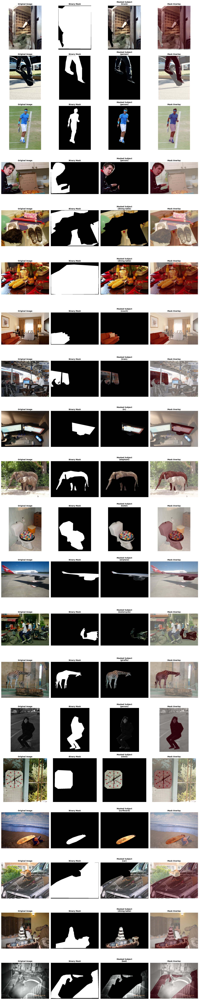


✓ Visualization complete!
✓ Results saved to: /content/coco_binary_masking_results.png


51

In [8]:
# CELL 8: Visualize Results
# =============================================================================
print("\n🖼️ Creating visualization...")

# Create figure for display
num_results = len(results)
fig, axes = plt.subplots(num_results, 4, figsize=(16, 4 * num_results))

# Handle single image case
if num_results == 1:
    axes = axes.reshape(1, -1)

for idx, result in enumerate(results):
    row = axes[idx]

    # Original image
    row[0].imshow(result['original'])
    row[0].set_title('Original Image', fontsize=10, fontweight='bold')
    row[0].axis('off')

    # Binary mask
    row[1].imshow(result['mask'], cmap='gray')
    row[1].set_title('Binary Mask', fontsize=10, fontweight='bold')
    row[1].axis('off')

    # Masked image (subject only)
    row[2].imshow(result['masked'])
    row[2].set_title(f'Masked Subject\n({result["category"]})', fontsize=10, fontweight='bold')
    row[2].axis('off')

    # Overlay
    row[3].imshow(result['original'])
    row[3].imshow(result['mask'], alpha=0.4, cmap='Reds')
    row[3].set_title('Mask Overlay', fontsize=10, fontweight='bold')
    row[3].axis('off')

plt.tight_layout()
plt.savefig('/content/coco_binary_masking_results.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✓ Visualization complete!")
print(f"✓ Results saved to: /content/coco_binary_masking_results.png")

# Clear results from memory
del results
gc.collect()


In [9]:
# CELL 9: Display Statistics
# =============================================================================
print("\n" + "="*60)
print("📊 PROCESSING STATISTICS")
print("="*60)
print(f"Total images in dataset: {len(img_ids)}")
print(f"Images selected for processing: {len(selected_ids)}")
print(f"Successfully processed: {successful_count}")
print(f"Failed: {len(failed_images)}")
print(f"Success rate: {(successful_count/len(selected_ids)*100):.1f}%")

# Memory usage
import psutil
process = psutil.Process(os.getpid())
memory_gb = process.memory_info().rss / 1024**3
print(f"\nCurrent memory usage: {memory_gb:.2f} GB")

# Disk usage
print("\n📊 Disk usage:")
!du -sh /content/coco/val2017 /content/coco/annotations


📊 PROCESSING STATISTICS
Total images in dataset: 5000
Images selected for processing: 20
Successfully processed: 20
Failed: 0
Success rate: 100.0%

Current memory usage: 0.39 GB

📊 Disk usage:
788M	/content/coco/val2017
796M	/content/coco/annotations


In [11]:
# CELL 13: Final Summary
# =============================================================================
print("\n" + "="*60)
print("🎉 BINARY MASKING COMPLETE!")
print("="*60)

print(f"\n📁 Output Files:")
print(f"  ✓ Combined visualization: /content/coco_binary_masking_results.png")

if os.path.exists('/content/processed_images'):
    num_files = len(os.listdir('/content/processed_images'))
    print(f"  ✓ Individual images: /content/processed_images/ ({num_files} files)")

print(f"\n💾 Final memory usage: {psutil.Process(os.getpid()).memory_info().rss / 1024**3:.2f} GB")

# Final garbage collection
gc.collect()

print("\n✅ All operations completed successfully!")
print("\n💡 Quick Tips:")
print("  • Download results from the Files panel (left sidebar)")
print("  • Results image shows: Original | Mask | Masked Subject | Overlay")
print("  • Re-run Cell 7 with different random.seed() for new images")
print("  • Adjust number of images by changing 'min(20, len(img_ids))' in Cell 7")

print("\n🔗 Dataset Info:")
print("  • Source: COCO 2017 Validation Set")
print("  • Images: 5,000 validation images")
print("  • Categories: 80 object classes")
print("  • URL: http://cocodataset.org/")


🎉 BINARY MASKING COMPLETE!

📁 Output Files:
  ✓ Combined visualization: /content/coco_binary_masking_results.png

💾 Final memory usage: 0.39 GB

✅ All operations completed successfully!

💡 Quick Tips:
  • Download results from the Files panel (left sidebar)
  • Results image shows: Original | Mask | Masked Subject | Overlay
  • Re-run Cell 7 with different random.seed() for new images
  • Adjust number of images by changing 'min(20, len(img_ids))' in Cell 7

🔗 Dataset Info:
  • Source: COCO 2017 Validation Set
  • Images: 5,000 validation images
  • Categories: 80 object classes
  • URL: http://cocodataset.org/
